In [1]:
# import libraries
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import sklearn.metrics as skm
import matplotlib.pyplot as plt
import seaborn as sns
import copy, time, matplotlib, sys

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, Dataset, Subset
from torchsummary import summary

import torchvision
import torchvision.transforms as T

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
# plt.rcParams.update({'font.size':11})

In [ ]:
# use GPU if available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

# What are autoencoders and what do they do?

In [ ]:
'''
* Autoencoder = a system that teaches itself how to encode information.

* Autoencoder architecture
- Input (K) - Encoder (N) - Bottleneck (Latent, Code) (M) - Decoder (N) - Output (K)
  Layer sizes: (K > N > M)

* What are autoencoders for?
- Data compression or dimension-reduction
- Data cleaning (denoising, despeckling, occlusion)
- Feature extraction
- Anomaly/fraud detection
- Pretraining deep or complex models

'''

# Denoising MNIST

## Import and process the data

In [2]:
data = np.loadtxt(open('sample_data/mnist_train_small.csv', 'rb'), delimiter=',')

data = data[:, 1:]
dataNorm = data / np.max(data)
data_tensor = torch.tensor(dataNorm).float()

## Create the DL model

In [3]:
def createTheMNISTAE():

    class aenet(nn.Module):
        def __init__(self):
            super().__init__()

            # input layer
            self.input = nn.Linear(784, 250)

            # encoder layer
            self.enc = nn.Linear(250, 50)

            # latent layer
            self.lat = nn.Linear(50, 250)

            # decoder layer
            self.dec = nn.Linear(250, 784)

        def forward(self, x):
            x = F.relu(self.input(x))
            x = F.relu(self.enc(x))
            x = F.relu(self.lat(x))
            y = torch.sigmoid( self.dec(x) )        # data normalized on [0 1] => output in same numerical range
            return y

    net = aenet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [4]:
# test the model with a bit of data
net, lossfunc, optimizer = createTheMNISTAE()

X = data_tensor[:5,:]
yHat = net(X)

print(X.shape)
print(yHat.shape)

torch.Size([5, 784])
torch.Size([5, 784])


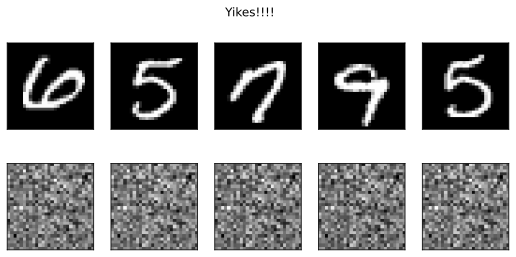

In [5]:
# let's see what the model did!
fig, axs = plt.subplots(2,5,figsize=(9,4))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(yHat[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.suptitle('Yikes!!!!')
plt.show()

## Create a function that trains the model

In [6]:
def function2trainTheModel():

    numepochs = 10000

    net, lossfunc, optimizer = createTheMNISTAE()

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        # select a random set of images
        random_idx = np.random.choice(data_tensor.shape[0], size=32)
        X = data_tensor[random_idx, :]

        # forward pass and loss
        yHat = net(X)
        loss = lossfunc(yHat, X)

        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses[epochi] = loss.item()

    return losses, net

## Run the model and show the results!

Final loss: 0.0062


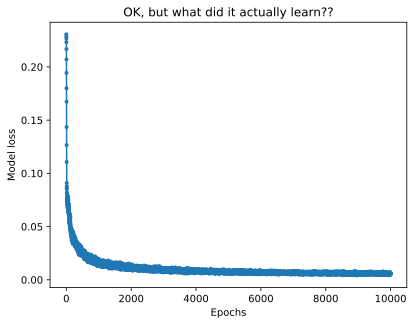

In [7]:
# train the model (16s)
losses, net = function2trainTheModel()
print(f'Final loss: {losses[-1]:.4f}')

# visualize the losses
plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.title('OK, but what did it actually learn??')
plt.show()

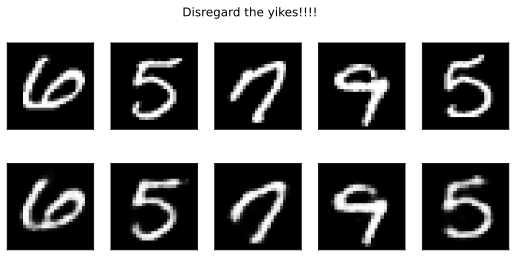

In [8]:
# Repeat the visualization when testing the model
X = data_tensor[:5,:]
yHat = net(X)

# let's see what the model did!
fig, axs = plt.subplots(2,5,figsize=(9,4))

for i in range(5):
    axs[0,i].imshow(X[i, :].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(yHat[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.suptitle('Disregard the yikes!!!!')
plt.show()

## Add noise to see a use case of an autoencoder

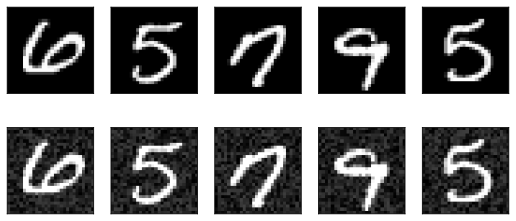

In [9]:
# grab a small set of images
X = data_tensor[:10, :]

# add noise
Xnoise = X + torch.rand_like(X)/4

# clip at 1
Xnoise[Xnoise>1] = 1

# show the noisy images
fig, axs = plt.subplots(2,5,figsize=(9,4))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.show()

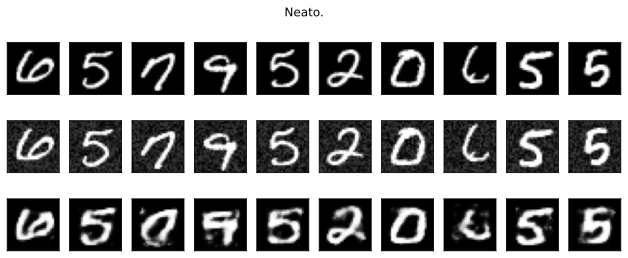

In [10]:
# run through the model
Y = net(Xnoise)

# show the noisy images
fig, axs = plt.subplots(3,10,figsize=(11,4))

for i in range(10):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach(), cmap='gray')
    axs[2,i].imshow(Y[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])

plt.suptitle('Neato.')
plt.show()

# How many units?

In [ ]:
'''
- Perform a parametric experiment to explore how the number of encoder/decoder units and the number of bottleneck units
  affects the loss.

'''

## Create the DL model

In [12]:
def createTheMNISTAE(n_enc, n_bottle):

    class aenet(nn.Module):
        def __init__(self):
            super().__init__()

            # input layer
            self.input = nn.Linear(784, n_enc)

            # encoder layer
            self.enc = nn.Linear(n_enc, n_bottle)

            # latent layer
            self.lat = nn.Linear(n_bottle, n_enc)

            # output layer
            self.dec = nn.Linear(n_enc, 784)

        def forward(self, x):
            x = F.relu(self.input(x))
            x = F.relu(self.enc(x))
            x = F.relu(self.lat(x))
            y = torch.sigmoid(self.dec(x))
            return y

    net = aenet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

## Create a function that trains the model

In [14]:
# note the difference in selecting samples compared to previous code!!!!

def function2trainTheModel(n_enc, n_bottle):

    # number of epochs
    numepochs = 3

    # create a new model
    net, lossfunc, optimizer = createTheMNISTAE(n_enc, n_bottle)

    # initialize losses
    losses = []

    # batch size and number of batches
    batchsize=32
    numBatches = int(data_tensor.shape[0] / batchsize)

    # loop over epochs (now each epoch goes through all samples)
    for epochi in range(numepochs):

        # get a permuted index vector
        rand_idx = np.random.permutation(data_tensor.shape[0]).astype(int)

        # losses during the batches
        batchLoss = []

        for batchi in range(numBatches):

            # samples to use in this batch
            samps2use = range((batchi-1)*batchsize, batchi*batchsize)

            # select those images
            X = data_tensor[rand_idx[samps2use], :]

            # forward pass and loss
            yHat = net(X)
            loss = lossfunc(yHat, X)

            # backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

        losses.append( np.mean(batchLoss[-3:]) )

    return losses, net

## Run the experiment!

In [ ]:
# note! this cell takes ~ 25 minutes with initial N settings

# specific the number of units
N_encdec_units = np.linspace(10,500,12).astype(int)
N_bottle_units = np.linspace(5,100,8).astype(int)

# initialize results matrix
exp_results = np.zeros((len(N_encdec_units), len(N_bottle_units)))

# start the experiment!
for ei, nenc in enumerate(N_encdec_units):
    for bi, nbot in enumerate(N_bottle_units):

        # build & train a model
        losses = function2trainTheModel(nenc, nbot)[0]
        exp_results[ei, bi] = losses[-1]

        # send update message
        currentIter = ei * len(N_bottle_units) + bi + 1
        totalIters = len(N_bottle_units) * len(N_encdec_units)
        msg = 'Finished experiment {} / {}.'.format(currentIter, totalIters)
        # sys.stdout.write('\r' + msg)
        sys.stdout.write('\n' + msg)

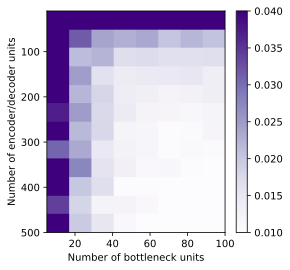

In [18]:
# show the results matrix
fig = plt.figure(figsize=(4,4))

plt.imshow(exp_results, aspect='auto', vmin=.01, vmax=.04, cmap='Purples',
           extent = [ N_bottle_units[0], N_bottle_units[-1], N_encdec_units[-1], N_encdec_units[0] ]) # xy axis ticks

plt.xlabel('Number of bottleneck units')
plt.ylabel('Number of encoder/decoder units')
plt.colorbar()

plt.show()

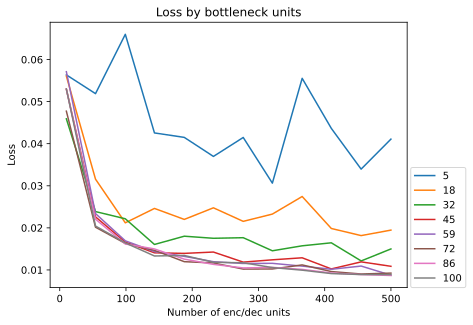

In [19]:
# perhaps a line plot will better reveal the sudden transition

plt.plot(N_encdec_units, exp_results)
plt.legend(N_bottle_units, loc=(1.01,0))
plt.xlabel('Number of enc/dec units')
plt.ylabel('Loss')
plt.title('Loss by bottleneck units')
plt.show()

# AEs for occlusion

In [ ]:
'''
* What "occlusion" means and why it's so important for biological and computer vision.
* Aboutn different types of performance metrics for autoencoders.
* Whether an autoencoder can solve the occlusion problem!

* What is occlusion?
- Occlusion is when depth partially blocks visual input.
- Brains solve this problem effortlessly and immediately.
- Can a FFN-AE reconstruct an occluded image?

'''

## Demonstration of implementing occlusion

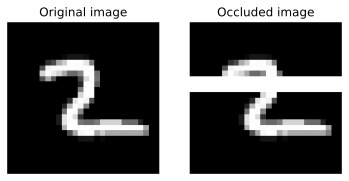

In [21]:
# reconstruct a sample as an image
img = data_tensor[12344, :].view(28,28)

occluded = copy.deepcopy(img)
occluded[10:13,:] = 1

fig, ax = plt.subplots(1,2,figsize=(6,4))

ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original image')
ax[0].axis('off')

ax[1].imshow(occluded, cmap='gray')
ax[1].set_title('Occluded image')
ax[1].axis('off')

plt.show()

## Create the DL model

In [22]:
def createTheMNISTAE():

    class aenet(nn.Module):
        def __init__(self):
            super().__init__()

            self.input = nn.Linear(784, 128)
            self.enc = nn.Linear(128, 50)
            self.lat = nn.Linear(50, 128)
            self.dec = nn.Linear(128, 784)

        def forward(self, x):
            x = F.relu(self.input(x))
            x = F.relu(self.enc(x))
            x = F.relu(self.lat(x))
            y = torch.sigmoid(self.dec(x))
            return y

    net = aenet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

## Create a function that trains the model

In [25]:
def function2trainTheModel():

    numepochs = 5

    net, lossfunc, optimizer = createTheMNISTAE()

    losses = []

    # batch size and number of batches
    batchsize=32
    numBatches = int(data_tensor.shape[0] / batchsize)

    for epochi in range(numepochs):

        # get a permuted index vector
        rand_idx = np.random.permutation(data_tensor.shape[0]).astype(int)

        for batchi in range(numBatches):

            # samples to use in this batch
            samps2use = range((batchi-1)*batchsize, batchi*batchsize)

            # select those images
            X = data_tensor[rand_idx[samps2use], :]

            yHat = net(X)
            loss = lossfunc(yHat, X)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            losses.append(loss.item())

    return losses, net

## Run the model and show the results!

Final loss: 0.0121


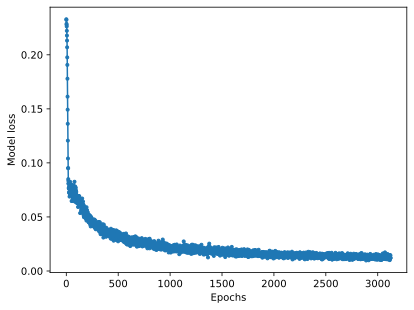

In [26]:
# train the model (16s)
losses, net = function2trainTheModel()
print(f'Final loss: {losses[-1]:.4f}')

# visualize the losses
plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

## Add occlusion to some images

In [27]:
# grab a small set of images
X = copy.deepcopy(data_tensor[:10, :])

# add noise
for i in range(X.shape[0]):

    # reshape the image
    img = X[i,:].view(28,28)

    # occlude random rows or columns
    startloc = np.random.choice(range(10,21))
    if i%2==0:                                                          # even -> horizontal occlusion
        img[startloc:startloc+1, :] = 1
    else:                                                                  # odd -> vertical occlusion
        img[:, startloc:startloc+1] = 1

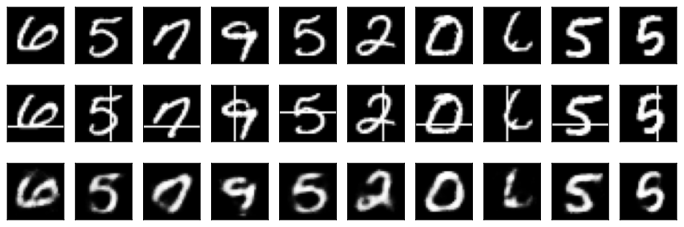

In [28]:
# run those samples through the model
deOccluded = net(X)

# show the noisy images
fig, axs = plt.subplots(3,10,figsize=(12,4))

for i in range(10):
    axs[0,i].imshow(data_tensor[i, :].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[2,i].imshow(deOccluded[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])

plt.show()

In [ ]:
'''
Why "occuding bars" disappeared?
- In training, the model learned "reduced dimensional representation of images".
- So the model squeezed images down from 784 to 50 dimensions and expanded back out.
- Now it learned that these numbers fit in a 50 dimensional space, but occluding bars nowhere to be found in those spaces.
- So they filtered out when getting down to the latent layer.
'''

## Something more quantitative

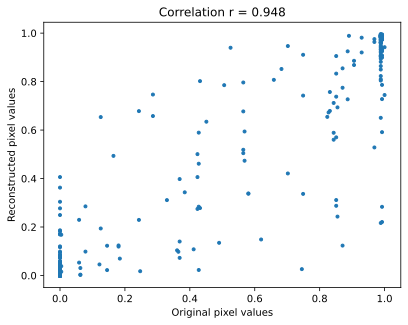

In [29]:
# We can quantify the performance of our "de-occluder" by correlating the sample with the original.

inOutCorr = np.corrcoef(data_tensor[9,:].detach(), deOccluded[9,:].detach())

# and plot
plt.plot(data_tensor[9,:].detach(), deOccluded[9,:].detach(), '.')
plt.xlabel('Original pixel values')
plt.ylabel('Reconstructed pixel values')
plt.title(f'Correlation r = {inOutCorr[0,1]:.3f}')
plt.show()

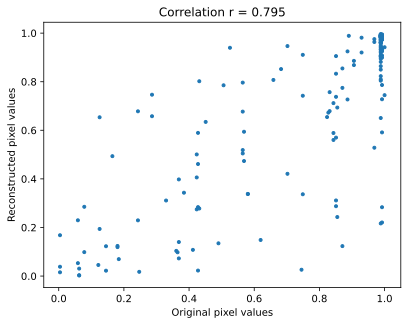

In [30]:
# try again without the zero-valued pixels

orig = data_tensor[9,:].detach()
recon = deOccluded[9,:].detach()

# boolean vector that indicates pixels>0 (with some tolerance)
tol = 1e-4
nonzeropixels = (orig>tol) & (recon>tol)

# then re-compute the correlation
inOutCorr = np.corrcoef(orig[nonzeropixels], recon[nonzeropixels])

# redraw the previous plot
plt.plot(orig[nonzeropixels], recon[nonzeropixels], '.')
plt.xlabel('Original pixel values')
plt.ylabel('Reconstructed pixel values')
plt.title(f'Correlation r = {inOutCorr[0,1]:.3f}')
plt.show()

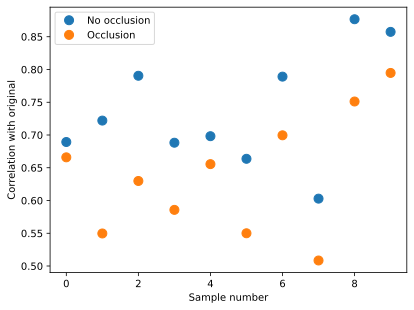

In [33]:
# get data with no occlusion
noOcclusion = net(data_tensor[:10,:])

# compare deOccluded-original to noOcclusion-original correlation
r = np.zeros((10,2))
for i in range(deOccluded.shape[0]):

    # pixel selection (note: tolerance defined in previous cell)
    nonzeropixels = (data_tensor[i, :]>tol) & (noOcclusion[i, :]>tol) & (deOccluded[i,:]>tol)

    # now compute the correlations
    r[i, 0] = np.corrcoef(data_tensor[i, nonzeropixels].detach(), noOcclusion[i, nonzeropixels].detach())[0,1]
    r[i, 1] = np.corrcoef(data_tensor[i, nonzeropixels].detach(), deOccluded[i, nonzeropixels].detach())[0,1]

# plot the correlation coefficients
plt.plot(r, 'o', markersize=9)
plt.legend(['No occlusion', 'Occlusion'])
plt.xlabel('Sample number')
plt.ylabel('Correlation with original')
plt.show()

# The latent code of MNIST

In [ ]:
'''
* How to separate and export the activations of hidden layer units.
* More about whether DL networks are interpretable...
'''

## Import and process the data

In [43]:
# import dataset (comes with colab!)
data = np.loadtxt(open('sample_data/mnist_train_small.csv','rb'),delimiter=',')

# we'll use the labels for matching with the latent code
labels = data[:,0]
data   = data[:,1:]

# normalize the data to a range of [0 1]
dataNorm = data / np.max(data)

# convert to tensor
data_tensor = torch.tensor( dataNorm ).float()

## Create the DL model

In [44]:
def createTheMNISTAE():

    class aenet(nn.Module):
        def __init__(self):
            super().__init__()

            self.input = nn.Linear(784, 150)
            self.enc = nn.Linear(150, 15)
            self.lat = nn.Linear(15, 150)
            self.dec = nn.Linear(150, 784)

        def forward(self, x):
            x = F.relu(self.input(x))

            # NEW! output the hidden-layer activation
            codex = F.relu(self.enc(x))

            x = F.relu(self.lat(codex))
            y = torch.sigmoid(self.dec(x))
            return y, codex

    net = aenet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [45]:
# test the model with a bit of data
net, lossfunc, optimizer = createTheMNISTAE()

X = data_tensor[:5, :]
yHat = net(X)

print('Input shape:')
print(X.shape)
print()

# yHat is now a typle
print(type(yHat), len(yHat))
print()

print('Shape of model output:')
print(yHat[0].shape)
print()

print('Shape of encoding layer output:')
print(yHat[1].shape)

Input shape:
torch.Size([5, 784])

<class 'tuple'> 2

Shape of model output:
torch.Size([5, 784])

Shape of encoding layer output:
torch.Size([5, 15])


## Create a function that trains the model

In [46]:
def function2trainTheModel():

    numepochs = 10000

    net, lossfunc, optimizer = createTheMNISTAE()

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        random_idx = np.random.choice(data_tensor.shape[0], size=32)
        X = data_tensor[random_idx, :]

        yHat = net(X)[0]    # NEW! here we only care about the final model output
        loss = lossfunc(yHat, X)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses[epochi] = loss.item()

    return losses, net

## Run the model and show the results!

Final losse: 0.0241


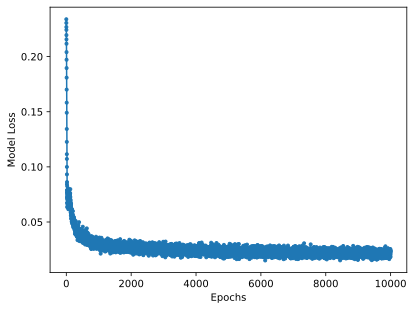

In [47]:
# train the model
losses, net = function2trainTheModel()
print(f'Final losse: {losses[-1]:.4f}')

# visualize the losses
plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model Loss')
plt.show()

## Inspect the latent "code" of the model

torch.Size([20000, 784])
torch.Size([20000, 15])


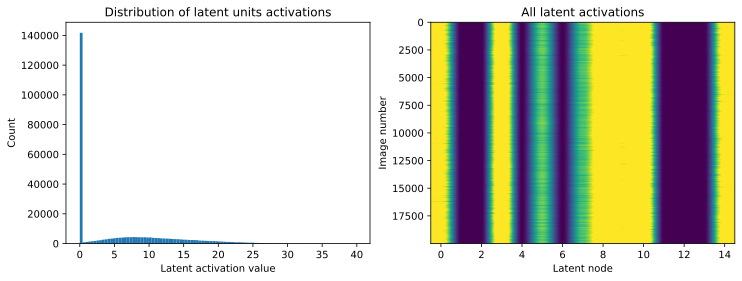

In [48]:
# output the latent layer

# push through the entire dataset
yHat, latent = net(data_tensor)

# print sizes
print(yHat.shape)
print(latent.shape)

# what does it look like?
fig, ax = plt.subplots(1,2,figsize=(12,4))

ax[0].hist(latent.flatten().detach(), 100)
ax[0].set_xlabel('Latent activation value')
ax[0].set_ylabel('Count')
ax[0].set_title('Distribution of latent units activations')

ax[1].imshow(latent.detach(), aspect='auto', vmin=0, vmax=10)
ax[1].set_xlabel('Latent node')
ax[1].set_ylabel('Image number')
ax[1].set_title('All latent activations')

plt.show()

<ipython-input-49-7179e0b6b327>:13: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  sourcecode[:,i] = torch.mean(latent[dig_idx, :], axis=1).detach()


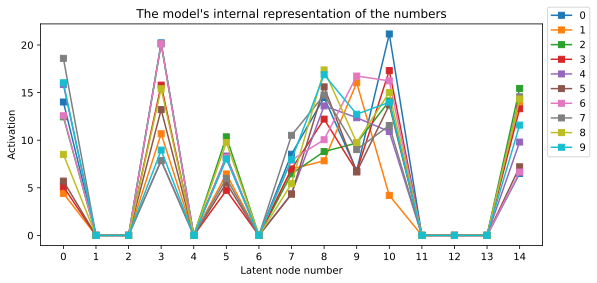

In [49]:
# compute the average latent activation for each digit type

# initialize output matrix (latent shape by 10 digits)
sourcecode = np.zeros((latent.shape[1], 10))

# loop over digit categories
for i in range(10):

    # find all pictures of this category
    dig_idx = np.where(labels==i)

    # average the latent layer output
    sourcecode[:,i] = torch.mean(latent[dig_idx, :], axis=1).detach()

# let's see what it looks like!
fig = plt.figure(figsize=(9,4))
plt.plot(sourcecode, 's-')
plt.legend(range(10), loc=(1.01, .4))
plt.xticks(range(15))
plt.xlabel('Latent node number')
plt.ylabel('Activation')
plt.title("The model's internal representation of the numbers")

plt.show()

## Explore the reduced_compressed space with PCA

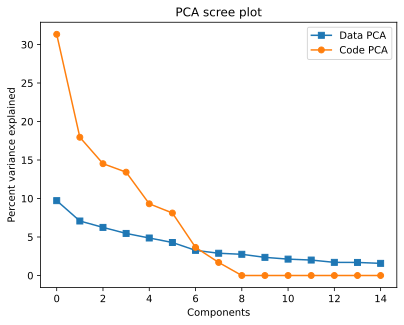

In [50]:
# compute and fit the PCA
pcaData = PCA(n_components=15).fit(data) # 15 components to match latent, but it's just to speed computation time
pcaCode = PCA().fit(latent.detach())

# plot the eigenspectra (scree plot)
plt.plot(100 * pcaData.explained_variance_ratio_, 's-', label='Data PCA')
plt.plot(100 * pcaCode.explained_variance_ratio_, 'o-', label='Code PCA')
plt.xlabel('Components')
plt.ylabel('Percent variance explained')
plt.title('PCA scree plot')
plt.legend()
plt.show()

In [52]:
# compute the projection of the data onto the PC axes
scoresData = pcaData.fit_transform(data)
scoresCode = pcaCode.fit_transform(latent.detach())

# plot the data separately per number
fig, ax = plt.subplots(1,2,figsize=(11,4))

for lab in range(10):
  ax[0].plot(scoresData[labels==lab,0],scoresData[labels==lab,1],'o',markersize=3,alpha=.4)
  ax[1].plot(scoresCode[labels==lab,0],scoresCode[labels==lab,1],'o',markersize=3,alpha=.4)

for i in range(2):
    ax[i].set_xlabel('PC1 projection')
    ax[i].set_ylabel('PC2 projection')
    ax[i].legend(range(10))

ax[0].set_title('PCA of data')
ax[1].set_title('PCA of latent code')
plt.show()

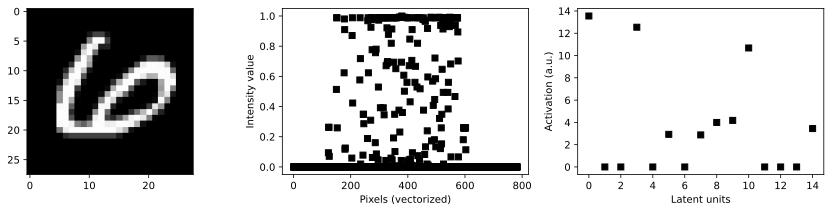

In [53]:
# This cell is not important! It's just the code I used to make the figure in the slide. I decided to leave it here FYI.

fig,ax = plt.subplots(1,3,figsize=(15,3))

ax[0].imshow(data_tensor[0,:].view(28,28),cmap='gray')

ax[1].plot(data_tensor[0,:],'ks')
ax[1].set_xlabel('Pixels (vectorized)')
ax[1].set_ylabel('Intensity value')

ax[2].plot(latent[0,:].detach(),'ks')
ax[2].set_xlabel('Latent units')
ax[2].set_ylabel('Activation (a.u.)')

plt.show()

# Autoencoder with tied weights

In [ ]:
'''
* What it means to "tie" weights across layers.
- Force the decoder weights to equal teh encoder weights.
- Have only one set of weights an re-use them for encoding and decoding.

* The advantages and limitations of models with tied weights.
- Advantages: Fewer model parameters to train. Lower risk of overfitting. Generally comparable performance to non-tied weights.
- Disadvantages: Performance might be lower. No theoretical guarantee that decoding is best done by mirroring encoding. Tricker to code.

'''

## An aside on Linear vs. Parameter classes

In [5]:
# create an input and weights matrix
x = torch.rand(10,50)
W1 = nn.Parameter(torch.randn(128,50))

# Let's see what W1 is
print(W1)
print('\n\n')

# Its size and the size of its transpose
print(W1.shape)
print(W1.t().shape)
print('\n\n')

# compute an output
y = x@W1.t()
print(y.shape)

Parameter containing:
tensor([[ 0.8587,  1.0600, -0.0336,  ..., -0.7701,  1.0493,  1.2546],
        [-0.3926, -0.6642, -1.0936,  ..., -0.9715, -0.1364, -0.9150],
        [ 0.4337,  0.1290, -0.2835,  ...,  0.4031, -1.3664, -0.8665],
        ...,
        [ 0.2709, -1.4711, -0.3822,  ..., -0.9023, -0.9154,  0.2970],
        [ 0.5354, -1.3192,  0.8593,  ...,  1.9101,  0.7239, -1.0965],
        [ 1.9088,  0.8165,  1.5610,  ...,  0.7509, -0.9052,  0.0789]],
       requires_grad=True)



torch.Size([128, 50])
torch.Size([50, 128])



torch.Size([10, 128])


In [9]:
# Now try again with the Linear method
W2 = nn.Linear(128, 50)

# Let's see what W2 is
print(W2)
print('\n\n')

# Its size and the size of its transpose
print(W2.weight.shape)
print(W2.weight.t().shape)
print('\n\n')

# compute an output
y = x@W2.weight
print(y.shape)

Linear(in_features=128, out_features=50, bias=True)



torch.Size([50, 128])
torch.Size([128, 50])



torch.Size([10, 128])


In [10]:
# confusion from the previous cells
print(W1.shape)
print(W2.weight.shape)

# confusion solved ;)
# (size of W -> [outputs, inputs], but nn.Linear expects [inputs, outputs])

torch.Size([128, 50])
torch.Size([50, 128])


In [ ]:
# see all attributes of the class Linear
dir(nn.Linear)

# and the docstring for Linear.forward
# ??nn.Linear.forward()
# ??nn.Linear.__init__ # note the inputs vs. how weight is created

## Import and process the data

In [15]:
data = np.loadtxt(open('sample_data/mnist_train_small.csv', 'rb'), delimiter=',')

data = data[:,1:]
dataNorm = data / np.max(data)

data_tensor = torch.tensor(dataNorm).float()

## Create the DL model

In [18]:
def createTheMNISTAE():

    class aenet(nn.Module):
        def __init__(self):
            super().__init__()

            # input layer
            self.input = nn.Linear(784, 128)

            # encoder layer
            self.enc = nn.Parameter(torch.randn(50,128)) # (out, in)
            # self.enc = nn.Linear(128, 50) # not used! left here for comparison

            # decoder layer (not used!)
            # self.dec = nn.Linear(50,128)

            # output layer
            self.out = nn.Linear(128, 784)

        # forward pass
        def forward(self, x):
            # "normal" forward prop in first stage
            x = F.relu( self.input(x) )

            # a Parameter type is not a Linear type, so we implement the multiplication directly
            x = x.t()                           # need to transpose the input matrix due to multisample input matrices
            x = F.relu( self.enc@x )

            # same for the decoding layer but reversed
            x = F.relu( self.enc.t()@x )
            x = x.t()                           # and then transpose it back

            # "normal" final stage
            y = torch.sigmoid( self.out(x) )
            return y

    # create the model instance
    net = aenet()

    lossfunc = nn.MSELoss()

    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [19]:
# test the model with a bit of data
net, lossfunc, optimizer = createTheMNISTAE()

X = data_tensor[:5, :]
yHat = net(X)

print(X.shape)
print(yHat.shape)

torch.Size([5, 784])
torch.Size([5, 784])


## Create a function that trains the model

In [20]:
def function2trainTheModel():

    numepochs = 10000

    # create a new model
    net, lossfunc, optimizer = createTheMNISTAE()

    # initialize losses
    losses = torch.zeros(numepochs)

    # loop over epochs
    for epochi in range(numepochs):

        # select a random set of images
        random_idx = np.random.choice(data_tensor.shape[0], size=32)
        X = data_tensor[random_idx, :]

        # forward pass and loss
        yHat = net(X)
        loss = lossfunc(yHat, X)

        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # losses in this batch
        losses[epochi] = loss.item()

    # function output
    return losses, net

## Run the model and show the results!

Final loss: 0.0130


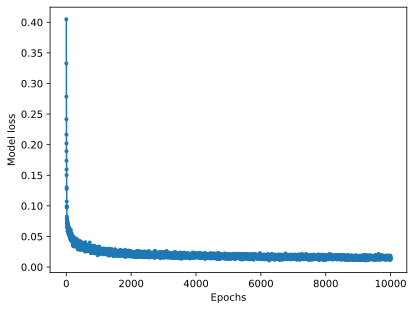

In [21]:
# train the model
losses, net = function2trainTheModel()
print(f'Final loss: {losses[-1]:.4f}')

# visualize the losses
plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

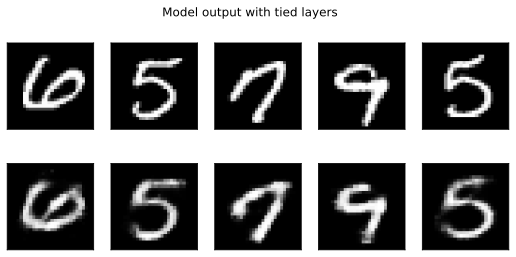

In [22]:
# Visualization of inputs and outputs
X = data_tensor[:5, :]
yHat = net(X)

# let's see what the model did!
fig, axs = plt.subplots(2,5,figsize=(9,4))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(yHat[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.suptitle('Model output with tied layers')
plt.show()

## Add noise to see a use case of an autoencoder

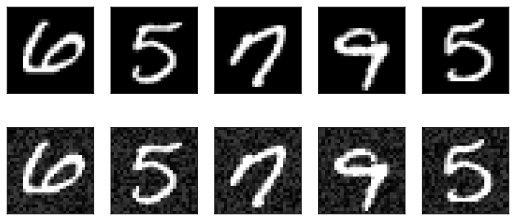

In [24]:
# grab a small set of images
X = data_tensor[:10,:]

# add noise
Xnoise = X + torch.rand_like(X)/4

# clip at 1
Xnoise[Xnoise>1] = 1

# show the noisy images
fig, axs = plt.subplots(2,5,figsize=(9,4))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.show()

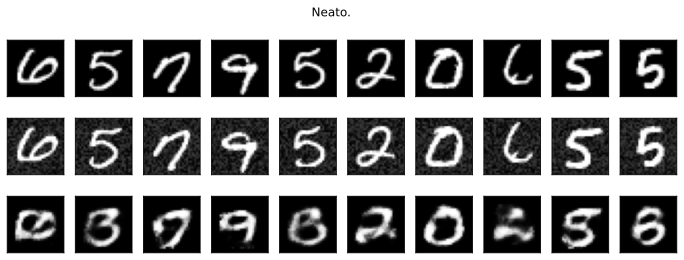

In [25]:
# run through the model
Y = net(Xnoise)

# show the noiosy images
fig, axs = plt.subplots(3,10, figsize=(12,4))

for i in range(10):
    axs[0,i].imshow(X[i,:].view(28,28).detach(), cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach(), cmap='gray')
    axs[2,i].imshow(Y[i,:].view(28,28).detach(), cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])

plt.suptitle('Neato.')
plt.show()